### Real Estate Price Prediction

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor, StackingRegressor, VotingRegressor, GradientBoostingRegressor
#from sklearn.preprocessing import StandardScaler
# from sklearn.svm import SVR
# from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [3]:
train_data = pd.read_csv('C:/Users/li_le/geekbrains_study/Price_prediction/train.csv', sep=',')
#train_data.head()

In [4]:
test_data = pd.read_csv('C:/Users/li_le/geekbrains_study/Price_prediction/test.csv', sep=',')
#test_data.head()

In [5]:
print(train_data.shape, test_data.shape)

(10000, 20) (5000, 19)


In [6]:
train_data.describe()


,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


In [7]:
train_data.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,NaN,10.0,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
1,3013,22,1.0,39.832524,23.169223,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
3,2352,1,1.0,40.409907,NaN,1.0,10,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,168106.007630
4,13866,94,2.0,64.285067,38.562517,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962


In [8]:
#train_data.info()

In [9]:
#test_data.info()

In [10]:
def reduce_mem(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print(f'Memory usage of dataframe is: {start_mem} Mb')
    
    for col in df.columns:
        
        col_type = df[col].dtype
        
        if col_type != 'object':
            d_min = df[col].min()
            d_max = df[col].max()            
            
            if str(col_type)[:3] == 'int':
                if d_min > np.iinfo(np.int8).min and d_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype('int8')
                elif d_min > np.iinfo(np.int16).min and d_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype('int16')
                elif d_min > np.iinfo(np.int32).min and d_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype('int32')
                elif d_min > np.iinfo(np.int64).min and d_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype('int64')
            else:
                if d_min > np.finfo(np.float32).min and d_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype('float32')
                else: df[col] = df[col].astype('float64')
                
        else: df[col] = df[col].astype('category')
        
    end_mem = df.memory_usage().sum() / 1024**2
    print(f'Memory usage after optimization is: {end_mem} MB')
    print(f'Decreased by {100 * (start_mem - end_mem) / start_mem} %')
    
    return df
            

In [11]:
train_data = reduce_mem(train_data)


Memory usage of dataframe is: 1.5260009765625 Mb
Memory usage after optimization is: 0.4868507385253906 MB
Decreased by 68.09630229581633 %


In [12]:
test_data = reduce_mem(test_data)



Memory usage of dataframe is: 0.72491455078125 Mb
Memory usage after optimization is: 0.21505355834960938 MB
Decreased by 70.33394375684095 %


In [13]:
train_data['Id'] = train_data['Id'].astype(str)

In [14]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             10000 non-null  object  
 1   DistrictId     10000 non-null  int16   
 2   Rooms          10000 non-null  float32 
 3   Square         10000 non-null  float32 
 4   LifeSquare     7887 non-null   float32 
 5   KitchenSquare  10000 non-null  float32 
 6   Floor          10000 non-null  int8    
 7   HouseFloor     10000 non-null  float32 
 8   HouseYear      10000 non-null  int32   
 9   Ecology_1      10000 non-null  float32 
 10  Ecology_2      10000 non-null  category
 11  Ecology_3      10000 non-null  category
 12  Social_1       10000 non-null  int8    
 13  Social_2       10000 non-null  int16   
 14  Social_3       10000 non-null  int16   
 15  Healthcare_1   5202 non-null   float32 
 16  Helthcare_2    10000 non-null  int8    
 17  Shops_1        10000 non-null  i

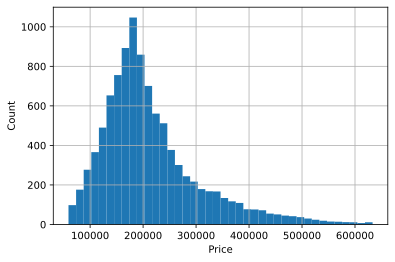

In [15]:
train_data['Price'].hist(bins=40)
plt.xlabel('Price')
plt.ylabel('Count')
plt.show()

### Обработка выбросов и пропусков

### DistrictId

In [16]:
train_data['DistrictId'].value_counts()

27     851
1      652
23     565
6      511
9      294
      ... 
196      1
117      1
205      1
199      1
207      1
Name: DistrictId, Length: 205, dtype: int64

In [17]:
train_data[train_data['DistrictId']==0].shape

(48, 20)

Скорее всего, DistrictId = 0  - ошибка

In [18]:
train_data['er_District'] = 0
train_data.loc[train_data['DistrictId']==0, 'er_District'] = 1

In [19]:
train_data['Rooms'].value_counts()

2.0     3880
1.0     3705
3.0     2235
4.0      150
5.0       18
0.0        8
10.0       2
6.0        1
19.0       1
Name: Rooms, dtype: int64

10 и 19 комнат - объекты станные, но возможные. Если это не ошибка, можно ожидать у них большую площадь и стоимость. (Хотя с 3 объектами можно было бы не заморачиваться)) 

In [20]:
train_data[train_data['Rooms']>6]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,er_District
2004,5927,57,10.0,59.056976,36.223072,10.0,22,22.0,2002,0.090799,...,B,74,19083,2,NaN,5,15,B,317265.312500,0
2728,14865,9,10.0,60.871265,38.420681,10.0,3,2.0,1994,0.161532,...,B,25,5648,1,30.0,2,4,B,172329.265625,0
6088,8491,1,19.0,42.006046,21.779287,7.0,17,17.0,2014,0.007122,...,B,1,264,0,NaN,0,1,B,78364.617188,0


Площади и цена не выбиваются, значит, скорее всего, это ошибочные значения.

In [21]:
train_data[train_data['Rooms']==0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,er_District
2194,3159,88,0.0,38.697117,19.345131,9.0,9,16.0,1982,0.127376,...,B,43,8429,3,NaN,3,9,B,158998.109375,0
3780,7317,27,0.0,41.790882,NaN,0.0,13,0.0,1977,0.211401,...,B,9,1892,0,NaN,0,1,B,98129.976562,0
5894,770,28,0.0,49.483501,NaN,0.0,16,0.0,2015,0.118537,...,B,30,6207,1,1183.0,1,0,B,217009.343750,0
6401,9443,27,0.0,87.762619,85.125473,0.0,5,15.0,1977,0.211401,...,B,9,1892,0,NaN,0,1,B,219281.921875,0
7644,7917,27,0.0,212.932358,211.231125,0.0,2,3.0,2008,0.211401,...,B,9,1892,0,NaN,0,1,B,302211.250000,0
7929,456,6,0.0,81.491447,NaN,0.0,4,0.0,1977,0.243205,...,B,5,1564,0,540.0,0,0,B,212864.796875,0
9767,12638,27,0.0,138.427689,136.215500,0.0,4,3.0,2016,0.075424,...,B,11,3097,0,NaN,0,0,B,268394.750000,0
9869,3224,27,0.0,2.377248,0.873147,0.0,1,0.0,1977,0.017647,...,B,2,469,0,NaN,0,0,B,126596.945312,0


Кроме ошибок с комнатами здесь ошибки с площадью кухни, в основном не заполнено Healthcare_1, много ошибок в HouseFloor. Лучше эти строки перед обучением вообще удалить. В тестовых данных и соответственно в общей функции поменяю значения 0 на моду.

In [22]:
train_data['er_rooms'] = 0
train_data.loc[(train_data['Rooms']==0)|(train_data['Rooms']>6), 'er_rooms'] = 1

In [23]:
train_data.loc[(train_data['Rooms']==0)|(train_data['Rooms']>6), 'Rooms'] = train_data['Rooms'].mode()[0]

In [24]:
#train_data.drop(train_data[train_data['Rooms']==0].index, axis=0, inplace=True)

In [25]:
#train_data.info()

In [26]:
#train_data['Rooms'].value_counts()

In [27]:
#test_data['Rooms'].value_counts()

### Дальше идут 3 связанных параметра: 'Square', 'LifeSquare', 'KitchenSquare'. 

In [28]:
# fig, ax = plt.subplots(nrows=1, ncols=3)

# ax[0].scatter(train_data['Square'], train_data['KitchenSquare'])
# ax[1].scatter(train_data['Square'], train_data['LifeSquare'])
# ax[2].scatter(train_data['LifeSquare'], train_data['KitchenSquare'])

# fig.set_size_inches(11, 3)
# fig.subplots_adjust(wspace=0.3)

### Square

In [29]:
train_data['er_Square'] = 0
train_data.loc[(train_data['Square']>300)|(train_data['Square']<5), 'er_Square'] = 1
train_data.loc[(train_data['Square']>300)|(train_data['Square']<5), 'Square'] = train_data['Square'].mode()[0]

### KitchenSquare

In [30]:
train_data[train_data['KitchenSquare']>50].describe()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,er_District,er_rooms,er_Square
count,21.000000,21.000000,21.000000,20.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,7.000000,21.000000,21.000000,21.000000,21.0,21.0,21.0
mean,48.476190,2.047619,69.087166,57.314888,256.428558,9.190476,13.523809,2005.714286,0.090262,18.095238,4424.380952,2.619048,1449.571411,1.047619,2.857143,229136.421875,0.0,0.0,0.0
std,34.436346,0.740013,25.734825,34.165234,577.423706,6.257947,7.632949,16.319139,0.118202,19.183078,4923.598130,5.380299,1271.185913,1.829650,3.863751,104042.062500,0.0,0.0,0.0
min,2.000000,1.000000,32.276665,2.400832,51.000000,3.000000,1.000000,1977.000000,0.000699,0.000000,168.000000,0.000000,645.000000,0.000000,0.000000,88150.015625,0.0,0.0,0.0
25%,27.000000,2.000000,53.216778,33.630577,58.000000,4.000000,10.000000,1994.000000,0.017647,2.000000,629.000000,0.000000,697.500000,0.000000,0.000000,160488.031250,0.0,0.0,0.0
50%,34.000000,2.000000,64.859245,52.316414,72.000000,8.000000,17.000000,2015.000000,0.069753,11.000000,2398.000000,1.000000,900.000000,0.000000,0.000000,212188.953125,0.0,0.0,0.0
75%,62.000000,3.000000,79.722244,68.357239,96.000000,12.000000,17.000000,2016.000000,0.072158,30.000000,5735.000000,3.000000,1539.000000,1.000000,5.000000,290354.468750,0.0,0.0,0.0
max,161.000000,3.000000,123.430069,125.806984,2014.000000,26.000000,25.000000,2019.000000,0.437885,53.000000,14892.000000,24.000000,4129.000000,6.000000,11.000000,445074.968750,0.0,0.0,0.0


In [31]:
train_data['er_KitchenSquare'] = 0
train_data.loc[(train_data['KitchenSquare']>50)|(train_data['KitchenSquare']>train_data['Square']), 'er_KitchenSquare'] = 1
train_data.loc[(train_data['KitchenSquare']>50)|(train_data['KitchenSquare']>train_data['Square']), 'KitchenSquare'] = train_data['KitchenSquare'].median()

In [32]:
train_data[train_data['KitchenSquare']<5]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,er_District,er_rooms,er_Square,er_KitchenSquare
3,2352,1,1.0,40.409908,NaN,1.0,10,22.0,1977,0.007122,...,0,NaN,0,1,B,168106.000000,0,0,0,0
8,9951,1,1.0,46.887894,44.628132,1.0,12,20.0,1977,0.007122,...,0,NaN,0,1,B,160400.406250,0,0,0,0
9,8094,6,3.0,79.867477,75.085129,1.0,3,17.0,2014,0.243205,...,0,540.0,0,0,B,194756.031250,0,0,0,0
18,4581,1,1.0,47.582481,NaN,1.0,16,16.0,1977,0.007122,...,0,NaN,0,1,B,128803.593750,0,0,0,0
19,367,45,1.0,42.367290,40.012527,1.0,16,14.0,2015,0.195781,...,6,NaN,3,2,B,250466.984375,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9982,10268,27,1.0,36.112392,1.855415,1.0,9,16.0,1977,0.211401,...,0,NaN,0,1,B,94881.695312,0,0,0,0
9983,647,1,2.0,63.324024,NaN,1.0,4,17.0,1977,0.007122,...,0,NaN,0,1,B,183809.328125,0,0,0,0
9990,10635,21,1.0,18.983963,11.419796,2.0,1,5.0,1967,0.194489,...,3,125.0,3,5,B,112411.218750,0,0,0,0
9991,11173,6,2.0,62.648777,NaN,0.0,6,17.0,1977,0.243205,...,0,540.0,0,0,B,182625.546875,0,0,0,0


Эти данные составляют треть от всех данных. И не очевидно, где должна пройти нижняя граница с ошибочной площадью. 

<AxesSubplot:>

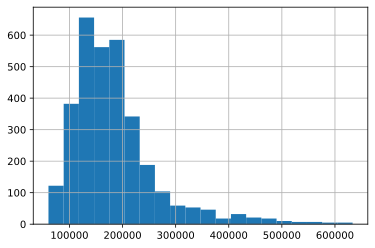

In [33]:
train_data[train_data['KitchenSquare']<5].Price.hist(bins=20)

Распределение похоже на полное распределение цены. И это аргумент в сторону того, что площади кухни меньше 5м2 - ошибочные, но нужны дополнительные проверки.
Если бы площади кухни менее 5 были действительными, то можно было бы ожидать, что им соответствуют квартиры с маленькой общей площадью, либо квартиры-студии (1 или 0 комнат), либо, например, определенный район или год постройки. Проверяю.

In [34]:
a = train_data[train_data['KitchenSquare']<5].copy()

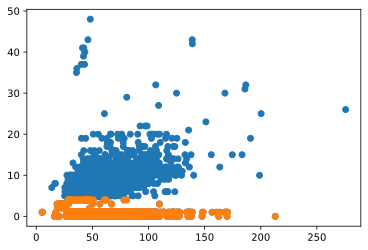

In [35]:
plt.scatter(train_data['Square'], train_data['KitchenSquare'])
plt.scatter(a['Square'], a['KitchenSquare'])
plt.show()

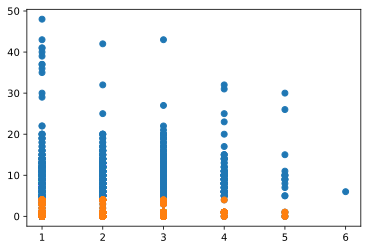

In [36]:
plt.scatter(train_data['Rooms'], train_data['KitchenSquare'])
plt.scatter(a['Rooms'], a['KitchenSquare'])
plt.show()

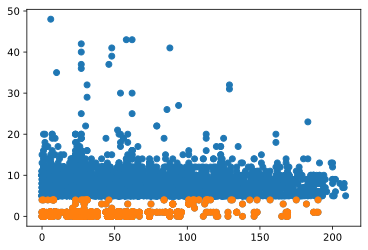

In [37]:
plt.scatter(train_data['DistrictId'], train_data['KitchenSquare'])
plt.scatter(a['DistrictId'], a['KitchenSquare'])
plt.show()

Предположения, написанные в замечании выше не подтвердились, скорее всего, данные с площадью кухни < 5 - ошибочные. Их можно заменять или удалять.

In [38]:
train_data.loc[train_data['KitchenSquare']<5, 'er_KitchenSquare'] = 1
train_data.loc[train_data['KitchenSquare']<5, 'KitchenSquare'] = 5

### LifeSquare

In [39]:
train_data[(train_data['LifeSquare']>300)|(train_data['LifeSquare']>train_data['Square'])]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,er_District,er_rooms,er_Square,er_KitchenSquare
33,847,74,2.0,73.314972,74.131264,5.0,7,6.0,1977,0.075779,...,3,NaN,0,2,B,254005.375000,0,0,0,1
64,3992,1,3.0,87.200623,87.730225,5.0,21,22.0,1977,0.007122,...,0,NaN,0,1,B,300180.375000,0,0,0,1
77,11771,45,1.0,38.467278,39.624493,5.0,11,9.0,1977,0.195781,...,6,NaN,3,2,B,247440.531250,0,0,0,1
100,13343,74,2.0,79.937668,82.931595,5.0,8,21.0,1977,0.075779,...,3,NaN,0,2,B,226808.750000,0,0,0,1
111,13875,20,1.0,28.438793,32.514023,6.0,6,10.0,2014,0.019509,...,11,176.0,5,5,B,199248.109375,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9960,16258,48,3.0,96.056786,98.152802,5.0,15,1.0,2017,0.041125,...,5,NaN,1,10,B,524365.562500,0,0,0,1
9962,14175,14,1.0,42.029175,44.682167,10.0,4,4.0,2018,0.238617,...,6,705.0,3,6,B,87556.382812,0,0,0,0
9979,2201,6,1.0,40.043236,41.984322,5.0,3,17.0,2014,0.243205,...,0,540.0,0,0,B,134888.078125,0,0,0,1
9987,11665,1,2.0,62.690056,64.602936,10.0,19,22.0,2018,0.007122,...,0,NaN,0,1,B,203908.187500,0,0,0,0


Опять довольно много данных с ошибками.

<AxesSubplot:>

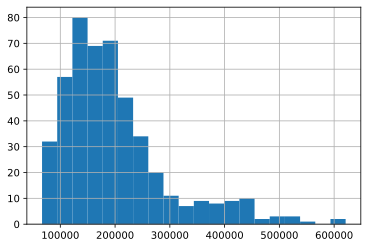

In [40]:
train_data[train_data['LifeSquare']>train_data['Square']].Price.hist(bins=20)

В целом распределение похоже на полное распределение цены. Можно удалить эти данные не сильно исказив распределение целевой переменной. Или заменить тем же способом, что и пропущенные значения.

In [41]:
train_data['er_LifeSquare'] = 0
train_data.loc[(train_data['LifeSquare']>300)|(train_data['LifeSquare']>train_data['Square']), 'er_LifeSquare'] = 1

In [42]:
#train_data.to_csv('temp_copy.csv', sep=',')

Ошибочные и пропушенные данные заменяю исходя из зависимости LifeSquare от Square-KitchenSquare.

In [43]:
a = train_data.copy()

In [44]:
condition = (a['er_Square']==1)|(a['er_KitchenSquare']==1)|(a['er_LifeSquare']==1)|(a['LifeSquare'].isnull())
a.drop(train_data[condition].index, axis=0, inplace=True)

In [45]:
fig, ax = plt.subplots(nrows=1, ncols=3)

ax[0].scatter(a['Square'], a['KitchenSquare'])
ax[1].scatter(a['Square'], a['LifeSquare'])
ax[2].scatter(a['LifeSquare'], a['KitchenSquare'])

fig.set_size_inches(11, 3)
fig.subplots_adjust(wspace=0.3)

In [46]:
# plt.scatter(a['Square'] - a['KitchenSquare'], a['LifeSquare'],)
# plt.ylabel('LifeSquare')
# plt.xlabel('Square-KitchenSquare')
# plt.axis([0, 300, 0, 300])
# plt.show()

In [47]:
lr = LinearRegression()

In [48]:
c_train = np.array(a['Square']-a['KitchenSquare'])

In [49]:
condition = (train_data['LifeSquare'].isnull())|(train_data['er_LifeSquare']==1)
c_test = np.array(train_data.loc[condition, 'Square']-train_data.loc[condition,'KitchenSquare'])

In [50]:
lr.fit(c_train.reshape(-1, 1), a['LifeSquare'])

LinearRegression()

In [51]:
lr.coef_

array([0.71573615], dtype=float32)

In [52]:
lr.intercept_

0.3999977

In [53]:
LS_pred = lr.predict(c_test.reshape(-1, 1))

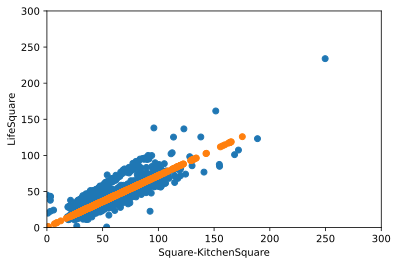

In [54]:
plt.scatter(a['Square'] - a['KitchenSquare'], a['LifeSquare'],)
plt.scatter(c_test, LS_pred)
plt.ylabel('LifeSquare')
plt.xlabel('Square-KitchenSquare')
plt.axis([0, 300, 0, 300])
plt.show()

In [55]:
train_data.loc[train_data['LifeSquare'].isnull(), 'er_LifeSquare'] = 1

In [56]:
train_data.loc[train_data['er_LifeSquare']==1, 'LifeSquare'] =LS_pred

### HouseFloor, Floor

In [57]:
train_data['HouseFloor'].sort_values().unique()

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        36.,  37.,  38.,  39.,  40.,  44.,  45.,  47.,  48.,  99., 117.],
      dtype=float32)

In [58]:
train_data['Floor'].sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 37, 42],
      dtype=int8)

In [59]:
(train_data['HouseFloor'] < train_data['Floor']).sum()

1825

In [60]:
# plt.scatter(train_data['HouseFloor'], train_data['Floor'])
# plt.show()

In [61]:
train_data['er_HouseFloor'] = 0
train_data.loc[(train_data['HouseFloor']<train_data['Floor'])|(train_data['HouseFloor']>50), 'er_HouseFloor'] = 1

In [62]:
train_data.loc[(train_data['HouseFloor']<train_data['Floor'])|(train_data['HouseFloor']>50), 'HouseFloor'] = train_data.loc[(train_data['HouseFloor']<train_data['Floor'])|(train_data['HouseFloor']>50), 'Floor']

### HouseYear

In [63]:
train_data['HouseYear'].sort_values().unique()

array([    1910,     1912,     1914,     1916,     1917,     1918,
           1919,     1928,     1929,     1930,     1931,     1932,
           1933,     1934,     1935,     1936,     1937,     1938,
           1939,     1940,     1941,     1942,     1947,     1948,
           1950,     1951,     1952,     1953,     1954,     1955,
           1956,     1957,     1958,     1959,     1960,     1961,
           1962,     1963,     1964,     1965,     1966,     1967,
           1968,     1969,     1970,     1971,     1972,     1973,
           1974,     1975,     1976,     1977,     1978,     1979,
           1980,     1981,     1982,     1983,     1984,     1985,
           1986,     1987,     1988,     1989,     1990,     1991,
           1992,     1993,     1994,     1995,     1996,     1997,
           1998,     1999,     2000,     2001,     2002,     2003,
           2004,     2005,     2006,     2007,     2008,     2009,
           2010,     2011,     2012,     2013,     2014,     2

In [64]:
train_data.loc[train_data['HouseYear']>2020, 'HouseYear'] = train_data['HouseYear'].mode()[0]

<AxesSubplot:>

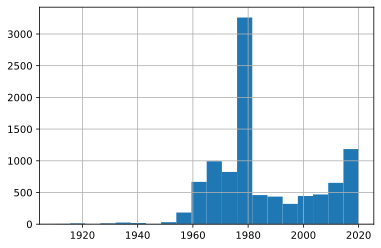

In [65]:
train_data['HouseYear'].hist(bins=20)

### Ecology

<AxesSubplot:>

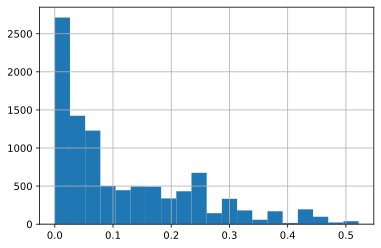

In [66]:
train_data['Ecology_1'].hist(bins=20)

In [67]:
train_data['Ecology_2'].value_counts()

B    9903
A      97
Name: Ecology_2, dtype: int64

In [68]:
train_data['Ecology_3'].value_counts()

B    9725
A     275
Name: Ecology_3, dtype: int64

In [69]:
train_data.groupby('Ecology_2')['Ecology_1'].median()

Ecology_2
A    0.225825
B    0.072158
Name: Ecology_1, dtype: float32

In [70]:
train_data.groupby('Ecology_3')['Ecology_1'].median()

Ecology_3
A    0.246032
B    0.072158
Name: Ecology_1, dtype: float32

### Social

array([[<AxesSubplot:title={'center':'Social_1'}>,
        <AxesSubplot:title={'center':'Social_2'}>],
       [<AxesSubplot:title={'center':'Social_3'}>, <AxesSubplot:>]],
      dtype=object)

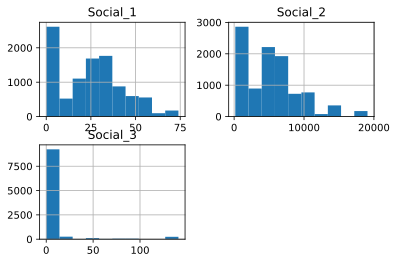

In [71]:
train_data[['Social_1', 'Social_2', 'Social_3']].hist()

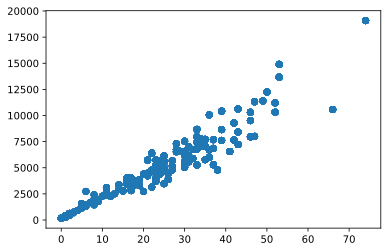

In [72]:
plt.scatter(train_data['Social_1'], train_data['Social_2'])
plt.show()

In [73]:
# plt.scatter(train_data['Social_1'], train_data['Social_3'])
# plt.show()

In [74]:
#train_data.loc[train_data['Social_3']>80].Price.hist(bins=30)

### Healthcare

<AxesSubplot:>

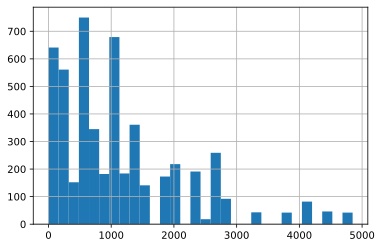

In [75]:
train_data['Healthcare_1'].hist(bins=30)

In [76]:
train_data['Helthcare_2'].value_counts()

0    4214
1    2183
3    1670
2    1158
5     388
4     288
6      99
Name: Helthcare_2, dtype: int64

In [77]:
a = train_data.groupby('Helthcare_2')['Healthcare_1'].median()

In [78]:
a

Helthcare_2
0     540.0
1     620.0
2     750.0
3    1145.0
4    1894.0
5    1575.0
6     645.0
Name: Healthcare_1, dtype: float32

In [79]:
train_data['HC_1_null']=0
train_data.loc[train_data['Healthcare_1'].isnull(), 'HC_1_null'] = 1

In [80]:
for i in a.index:
    train_data.loc[(train_data['Healthcare_1'].isnull())&(train_data['Helthcare_2'] == i), 'Healthcare_1'] = a.loc[i]

In [81]:
train_data.loc[train_data['HC_1_null']==1].groupby('Helthcare_2')['Healthcare_1'].median()

Helthcare_2
0     540.0
1     620.0
2     750.0
3    1145.0
5    1575.0
Name: Healthcare_1, dtype: float32

### Shops

<AxesSubplot:>

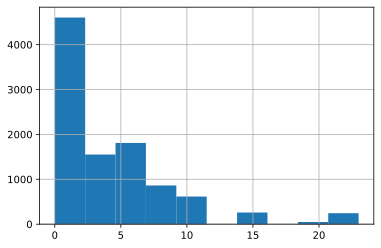

In [82]:
train_data['Shops_1'].hist(bins=10)

In [83]:
train_data['Shops_2'].value_counts()

B    9175
A     825
Name: Shops_2, dtype: int64

In [84]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Id                10000 non-null  object  
 1   DistrictId        10000 non-null  int16   
 2   Rooms             10000 non-null  float32 
 3   Square            10000 non-null  float32 
 4   LifeSquare        10000 non-null  float32 
 5   KitchenSquare     10000 non-null  float32 
 6   Floor             10000 non-null  int8    
 7   HouseFloor        10000 non-null  float32 
 8   HouseYear         10000 non-null  int32   
 9   Ecology_1         10000 non-null  float32 
 10  Ecology_2         10000 non-null  category
 11  Ecology_3         10000 non-null  category
 12  Social_1          10000 non-null  int8    
 13  Social_2          10000 non-null  int16   
 14  Social_3          10000 non-null  int16   
 15  Healthcare_1      10000 non-null  float32 
 16  Helthcare_2       10000

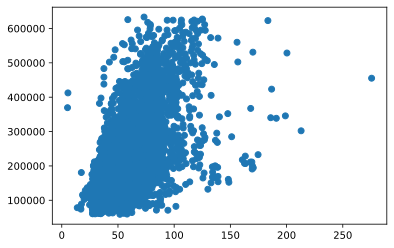

In [85]:
plt.scatter(train_data['Square'], train_data['Price'])
plt.show()

In [86]:
lr.fit(np.array(train_data['Square']).reshape(-1, 1), train_data['Price'])

LinearRegression()

In [87]:
lr.intercept_, lr.coef_

(55421.688, array([2824.369], dtype=float32))

In [88]:
# plt.scatter((train_data['Price']/train_data['Square']), train_data['Price'])
# plt.axis([0, 20000, 0, 650000])
# plt.show()

In [89]:
# plt.figure(figsize = (15,10))
# corr_matrix = train_data.corr()
# corr_matrix = np.round(corr_matrix, 2)
# corr_matrix[np.abs(corr_matrix) < 0.3] = 0

# sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='coolwarm')

# plt.title('Correlation matrix')
# plt.show()

In [90]:
class DataPreprocessing:
    """Подготовка исходных данных"""

    def __init__(self):
        """Параметры класса"""
        self.medians = None
        self.modes = None
        
    def fit(self, X):
        """Сохранение статистик"""       
        self.medians = X.median()
        self.modes = X.mode(axis=0, numeric_only=True)
    
    def transform(self, X):
        """Трансформация данных"""
        # District
        X['er_District'] = 0
        X.loc[X['DistrictId']==0, 'er_District'] = 1
        
        # Rooms
        X['er_rooms'] = 0
        X.loc[(X['Rooms']==0)|(X['Rooms']>6), 'er_rooms'] = 1
        #X.loc[(X['Rooms']==0)|(X['Rooms']>6), 'Rooms'] = X['Rooms'].mode()[0]
        X.loc[(X['Rooms']==0)|(X['Rooms']>6), 'Rooms'] = self.modes.loc[0, 'Rooms']
        
        #Square
        X['er_Square'] = 0
        X.loc[(X['Square']>300)|(X['Square']<5), 'er_Square'] = 1
        #X.loc[X['Square']>300, 'Square'] = X['Square'].mode()[0]
        X.loc[(X['Square']>300)|(X['Square']<5), 'Square'] = self.modes.loc[0, 'Square']
        
        # KitchenSquare
        X['er_KitchenSquare'] = 0
        condition = (X['KitchenSquare']>50)|(X['KitchenSquare']>X['Square'])
        X.loc[condition|(X['KitchenSquare']<5), 'er_KitchenSquare'] = 1
        X.loc[condition, 'KitchenSquare'] = self.medians['KitchenSquare']
        X.loc[X['KitchenSquare']<5, 'KitchenSquare'] = 5
        
        # LifeSquare
        X['er_LifeSquare'] = 0
        
        X.loc[(X['LifeSquare']>300)|(X['LifeSquare']>X['Square'])|(X['LifeSquare'].isnull()), 'er_LifeSquare'] = 1
        
        a = X.copy()
        condition = (a['er_Square']==1)|(a['er_KitchenSquare']==1)|(a['er_LifeSquare']==1)
        a.drop(X[condition].index, axis=0, inplace=True)
        
        lr = LinearRegression()
        c_train = np.array(a['Square']-a['KitchenSquare'])
        c_test = np.array(X.loc[X['er_LifeSquare']==1, 'Square']-X.loc[X['er_LifeSquare']==1,'KitchenSquare'])
        lr.fit(c_train.reshape(-1, 1), a['LifeSquare'])
        LS_pred = lr.predict(c_test.reshape(-1, 1))
        
        X.loc[X['er_LifeSquare']==1, 'LifeSquare'] =LS_pred        
              
        # HouseFloor, Floor
        X['er_HouseFloor'] = 0
        X.loc[(X['HouseFloor']<X['Floor'])|(X['HouseFloor']>50), 'er_HouseFloor'] = 1
        X.loc[(X['HouseFloor']<X['Floor'])|(X['HouseFloor']>50), 'HouseFloor'] = X.loc[(X['HouseFloor']<X['Floor'])|(X['HouseFloor']>50), 'Floor']
               
        # HouseYear
        X.loc[X['HouseYear']>2020, 'HouseYear'] = self.modes.loc[0, 'HouseYear']
        
        # Healthcare_1
        X['HC_1_null']=0
        X.loc[X['Healthcare_1'].isnull(), 'HC_1_null'] = 1
        
        a = X.groupby('Helthcare_2')['Healthcare_1'].median()
        for i in a.index:
            X.loc[(X['Healthcare_1'].isnull())&(X['Helthcare_2'] == i), 'Healthcare_1'] = a.loc[i]
   
        
        return X

## Построение новых признаков

In [91]:
binary_to_numbers = {'A': 0, 'B': 1}

train_data['Ecology_2'] = train_data['Ecology_2'].replace(binary_to_numbers)
train_data['Ecology_3'] = train_data['Ecology_3'].replace(binary_to_numbers)
train_data['Shops_2'] = train_data['Shops_2'].replace(binary_to_numbers)

### DistrictSize, IsDistrictLarge

In [92]:
district_size = train_data['DistrictId'].value_counts().reset_index().rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})

In [93]:
district_size.head()

,DistrictId,DistrictSize
0,27,851
1,1,652
2,23,565
3,6,511
4,9,294


In [94]:
train_data = train_data.merge(district_size, how='left', on='DistrictId')
train_data.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Shops_2,Price,er_District,er_rooms,er_Square,er_KitchenSquare,er_LifeSquare,er_HouseFloor,HC_1_null,DistrictSize
0,11809,27,3.0,115.027313,75.571838,10.0,4,10.0,2014,0.075424,...,1,305018.875000,0,0,0,0,1,0,1,851
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,...,1,177734.546875,0,0,0,0,0,0,0,78
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,...,1,282078.718750,0,0,0,0,0,0,0,652
3,2352,1,1.0,40.409908,25.744148,5.0,10,22.0,1977,0.007122,...,1,168106.000000,0,0,0,1,1,0,1,652
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,...,1,343995.093750,0,0,0,0,0,0,1,89


In [95]:
#train_data['DistrictSize'].hist(bins=20)

In [96]:
(train_data['DistrictSize'] > 200).value_counts()

False    6652
True     3348
Name: DistrictSize, dtype: int64

In [97]:
#train_data['DistrictSize'].isna().sum()

In [98]:
train_data['IsDistrictLarge'] = (train_data['DistrictSize'] > 200).astype(int)

### MedPriceByDistrict

In [99]:
med_price_by_district = train_data.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price':'median'}).rename(columns={'Price':'MedPriceByDistrict'})
med_price_by_district.head()

,DistrictId,Rooms,MedPriceByDistrict
0,0,1.0,142799.437500
1,0,2.0,176210.812500
2,0,3.0,300610.375000
3,1,1.0,146735.671875
4,1,2.0,202666.312500


In [100]:
train_data = train_data.merge(med_price_by_district, on=['DistrictId', 'Rooms'], how='left')
train_data.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,er_District,er_rooms,er_Square,er_KitchenSquare,er_LifeSquare,er_HouseFloor,HC_1_null,DistrictSize,IsDistrictLarge,MedPriceByDistrict
0,11809,27,3.0,115.027313,75.571838,10.0,4,10.0,2014,0.075424,...,0,0,0,0,1,0,1,851,1,213530.781250
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,...,0,0,0,0,0,0,0,78,0,146032.828125
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,...,0,0,0,0,0,0,0,652,1,244005.281250
3,2352,1,1.0,40.409908,25.744148,5.0,10,22.0,1977,0.007122,...,0,0,0,1,1,0,1,652,1,146735.671875
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,...,0,0,0,0,0,0,1,89,0,201584.437500


### MedPriceByFloorYear

In [101]:
def floor_to_cat(X):
    bins = [0, 1, 3, 6, 10, 15, X['Floor'].max()]
    X['floor_cat'] = pd.cut(X['Floor'], bins=bins, labels=False)
    X['floor_cat'].fillna(-1, inplace=True)
    return X

In [102]:
def year_to_cat(X):
    bins = [0, 1900, 1941, 1950, 1975, 1990, 2000, 2010, X['HouseYear'].max()]
    X['year_cat'] = pd.cut(X['HouseYear'], bins=bins, labels=False)    
    X['year_cat'].fillna(-1, inplace=True)
    return X

In [103]:
train_data = year_to_cat(train_data)
train_data = floor_to_cat(train_data)
train_data.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,er_Square,er_KitchenSquare,er_LifeSquare,er_HouseFloor,HC_1_null,DistrictSize,IsDistrictLarge,MedPriceByDistrict,year_cat,floor_cat
0,11809,27,3.0,115.027313,75.571838,10.0,4,10.0,2014,0.075424,...,0,0,1,0,1,851,1,213530.781250,7,2
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,...,0,0,0,0,0,78,0,146032.828125,3,3
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,...,0,0,0,0,0,652,1,244005.281250,4,1
3,2352,1,1.0,40.409908,25.744148,5.0,10,22.0,1977,0.007122,...,0,1,1,0,1,652,1,146735.671875,4,3
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,...,0,0,0,0,1,89,0,201584.437500,3,5


In [104]:
med_price_by_floor_year = train_data.groupby(['year_cat', 'floor_cat'], as_index=False).agg({'Price':'median'}).rename(columns={'Price':'MedPriceByFloorYear'})
med_price_by_floor_year.head()

,year_cat,floor_cat,MedPriceByFloorYear
0,1,0,263299.71875
1,1,1,410299.96875
2,1,2,324303.81250
3,1,3,392227.56250
4,1,4,274992.46875


In [105]:
# a = pd.pivot_table(med_price_by_floor_year, index=['year_cat'], columns=['floor_cat'])
# a

In [106]:
# a.columns = [0, 1, 2, 3, 4, 5]

In [107]:
# plt.scatter(a.index, a[0])
# plt.scatter(a.index, a[1])
# plt.scatter(a.index, a[2])
# plt.scatter(a.index, a[3])
# plt.scatter(a.index, a[4])
# plt.scatter(a.index, a[5])
# plt.show()


In [108]:
train_data = train_data.merge(med_price_by_floor_year, on=['year_cat', 'floor_cat'], how='left')
train_data.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,er_KitchenSquare,er_LifeSquare,er_HouseFloor,HC_1_null,DistrictSize,IsDistrictLarge,MedPriceByDistrict,year_cat,floor_cat,MedPriceByFloorYear
0,11809,27,3.0,115.027313,75.571838,10.0,4,10.0,2014,0.075424,...,0,1,0,1,851,1,213530.781250,7,2,167694.187500
1,3013,22,1.0,39.832523,23.169222,8.0,7,8.0,1966,0.118537,...,0,0,0,0,78,0,146032.828125,3,3,204377.109375
2,8215,1,3.0,78.342216,47.671970,10.0,2,17.0,1988,0.025609,...,0,0,0,0,652,1,244005.281250,4,1,175018.531250
3,2352,1,1.0,40.409908,25.744148,5.0,10,22.0,1977,0.007122,...,1,1,0,1,652,1,146735.671875,4,3,186537.390625
4,13866,94,2.0,64.285065,38.562515,9.0,16,16.0,1972,0.282798,...,0,0,0,1,89,0,201584.437500,3,5,222171.093750


In [109]:
# plt.scatter(train_data['Price'],train_data['MedPriceByDistrict'])
# plt.scatter(train_data['Price'],train_data['MedPriceByFloorYear'])
# plt.show()

In [110]:
train_data['SocialRatio'] = train_data['Social_1']/train_data['Social_2']
#train_data.head()

In [111]:
train_data['RoomsSize'] = train_data['Square']/train_data['Rooms']
#train_data.head()

In [112]:
class FeatureGenetator():
    """Генерация новых фич"""
    
    def __init__(self):
        self.DistrictId_counts = None
        self.binary_to_numbers = None
        self.med_price_by_district = None
        self.med_price_by_floor_year = None
        self.house_year_max = None
        self.floor_max = None
        self.district_size = None
        
    def fit(self, X, y=None):        
           
        # Binary features
        self.binary_to_numbers = {'A': 0, 'B': 1}
        
        # DistrictID
        self.district_size = X['DistrictId'].value_counts().reset_index().rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})
                
        # Target encoding
        ## District, Rooms
        df = X.copy()
        
        if y is not None:
            df['Price'] = y.values
            
            self.med_price_by_district = df.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price':'median'})\
                                            .rename(columns={'Price':'MedPriceByDistrict'})
            
            self.med_price_by_district_median = self.med_price_by_district['MedPriceByDistrict'].median()
           
            
        ## floor, year        
            self.floor_max = df['Floor'].max()
            self.house_year_max = df['HouseYear'].max()
            df = self.floor_to_cat(df)
            df = self.year_to_cat(df)
            self.med_price_by_floor_year = df.groupby(['year_cat', 'floor_cat'], as_index=False).agg({'Price':'median'}).\
                                            rename(columns={'Price':'MedPriceByFloorYear'})
            self.med_price_by_floor_year_median = self.med_price_by_floor_year['MedPriceByFloorYear'].median()
        

        
    def transform(self, X):
        
        # Binary features
        X['Ecology_2'] = X['Ecology_2'].map(self.binary_to_numbers)  # self.binary_to_numbers = {'A': 0, 'B': 1}
        X['Ecology_3'] = X['Ecology_3'].map(self.binary_to_numbers)
        X['Shops_2'] = X['Shops_2'].map(self.binary_to_numbers)
        
        # DistrictId, IsDistrictLarge
        
        X = X.merge(self.district_size, on='DistrictId', how='left')
          
        X['new_district'] = 0
        X.loc[X['DistrictSize'].isna(), 'new_district'] = 1
        
        X['DistrictSize'].fillna(5, inplace=True)
        
        X['IsDistrictLarge'] = (X['DistrictSize'] > 200).astype(int)
        
        # SocialRatio, RoomsSize
        X['SocialRatio'] = X['Social_1']/X['Social_2']
        X['RoomsSize'] = X['LifeSquare']/X['Rooms']        
              
        # More categorical features
        X = self.floor_to_cat(X)  # + столбец floor_cat
        X = self.year_to_cat(X)   # + столбец year_cat
        
        # Target encoding
        if self.med_price_by_district is not None:
            X = X.merge(self.med_price_by_district, on=['DistrictId', 'Rooms'], how='left')
            X['MedPriceByDistrict'].fillna(self.med_price_by_district_median, inplace=True)
            
        if self.med_price_by_floor_year is not None:
            X = X.merge(self.med_price_by_floor_year, on=['year_cat', 'floor_cat'], how='left')
            X['MedPriceByFloorYear'].fillna(self.med_price_by_floor_year_median, inplace=True)
        
        return X
    
    def floor_to_cat(self, X):
        bins = [0, 1, 3, 6, 10, 15, self.floor_max]
        X['floor_cat'] = pd.cut(X['Floor'], bins=bins, labels=False)

        X['floor_cat'].fillna(-1, inplace=True)
        return X
     
    def year_to_cat(self, X):
        bins = [0, 1900, 1941, 1950, 1975, 1990, 2000, 2010, self.house_year_max]
        X['year_cat'] = pd.cut(X['HouseYear'], bins=bins, labels=False)

        X['year_cat'].fillna(-1, inplace=True)
        return X

### Отбор признаков

In [113]:
train_data.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'er_District', 'er_rooms',
       'er_Square', 'er_KitchenSquare', 'er_LifeSquare', 'er_HouseFloor',
       'HC_1_null', 'DistrictSize', 'IsDistrictLarge', 'MedPriceByDistrict',
       'year_cat', 'floor_cat', 'MedPriceByFloorYear', 'SocialRatio',
       'RoomsSize'],
      dtype='object')

In [114]:
feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
                 'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_3', 'Healthcare_1',
                 'Helthcare_2', 'Shops_1', 'Shops_2']
# feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
#                  'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
#                  'Helthcare_2', 'Shops_1', 'Shops_2', 'DistrictSize', 'IsDistrictLarge']

In [115]:
# new_feature_names = ['er_District', 'er_rooms', 'er_Square', 'er_KitchenSquare', 'er_LifeSquare', 'er_HouseFloor',
#        'HC_1_null', 'DistrictSize', 'IsDistrictLarge', 'MedPriceByFloorYear', 'SocialRatio',
#        'RoomsSize', 'ShopSumByDistrict', 'NFlats_to_NShops', 'HC1SumByDistrict', 'HC2SumByDistrict', 'Social3ByDistrict']
new_feature_names = ['er_District', 'er_rooms', 'er_Square', 'er_KitchenSquare', 'er_LifeSquare', 'er_HouseFloor',
       'HC_1_null', 'DistrictSize', 'IsDistrictLarge',
        'MedPriceByFloorYear', 'SocialRatio','RoomsSize']

### Разбиение на train и test

In [116]:
train_df = pd.read_csv('C:/Users/li_le/geekbrains_study/Price_prediction/train.csv', sep=',')
test_df = pd.read_csv('C:/Users/li_le/geekbrains_study/Price_prediction/test.csv', sep=',')

In [117]:
train_df = reduce_mem(train_df)
test_df = reduce_mem(test_df)

Memory usage of dataframe is: 1.5260009765625 Mb
Memory usage after optimization is: 0.4868507385253906 MB
Decreased by 68.09630229581633 %
Memory usage of dataframe is: 0.72491455078125 Mb
Memory usage after optimization is: 0.21505355834960938 MB
Decreased by 70.33394375684095 %


In [118]:
x = train_df.drop(columns='Price')
#y = train_df['Price']
y = train_df[['Id','Price']]

In [119]:
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3, shuffle=True, random_state=13)

In [120]:
preprocessor = DataPreprocessing()
preprocessor.fit(x_train)
x_train = preprocessor.transform(x_train)
x_valid = preprocessor.transform(x_valid)
test_df = preprocessor.transform(test_df)


In [121]:
x_train.shape, x_valid.shape, test_df.shape

((7000, 26), (3000, 26), (5000, 26))

In [122]:
#x_valid.info()

In [123]:
features_gen = FeatureGenetator()
features_gen.fit(x_train, y_train['Price'])

x_train = features_gen.transform(x_train)
x_valid = features_gen.transform(x_valid)
test_df = features_gen.transform(test_df)

In [124]:
x_train = x_train.set_index('Id').sort_index()
x_valid = x_valid.set_index('Id').sort_index()
test_df = test_df.set_index('Id').sort_index()
y_train = y_train.set_index('Id').sort_index()
y_valid = y_valid.set_index('Id').sort_index()

In [125]:
x_train.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,HC_1_null,DistrictSize,new_district,IsDistrictLarge,SocialRatio,RoomsSize,floor_cat,year_cat,MedPriceByDistrict,MedPriceByFloorYear
Id,,,,,,,,,,,,,,,,,,,,,
0,0,1.0,109.144493,84.613937,15.0,6,15.0,2011.0,0.319809,1,...,0,36,0,0,0.005257,84.613937,2,7,136421.84375,170847.421875
2,2,1.0,34.472263,16.069376,5.0,5,18.0,1969.0,0.000000,1,...,1,59,0,0,0.004444,16.069376,2,3,170629.75000,194402.375000
5,5,3.0,57.607964,38.955673,5.0,3,9.0,1974.0,0.150818,1,...,0,22,0,0,0.004661,12.985225,1,3,257571.43750,189565.843750
14,12,2.0,57.639462,34.425480,8.0,17,17.0,1990.0,0.090799,1,...,1,46,0,0,0.003878,17.212740,5,4,238863.78125,186886.859375
15,13,1.0,46.833813,21.755192,9.0,6,25.0,2001.0,0.090799,1,...,1,70,0,0,0.003878,21.755192,2,6,184480.59375,253534.265625


In [126]:
#x_train.shape, x_valid.shape, test_df.shape

In [127]:
x_train = x_train[feature_names + new_feature_names]
x_valid = x_valid[feature_names + new_feature_names]
test_df = test_df[feature_names + new_feature_names]
# x_train = x_train[feature_names]
# x_valid = x_valid[feature_names]
# test_df = test_df[feature_names]

In [128]:
x_train.shape, x_valid.shape, test_df.shape

((7000, 28), (3000, 28), (5000, 28))

In [129]:
#x_train.info()

In [130]:
x_train.isna().sum().sum(), x_valid.isna().sum().sum(), test_df.isna().sum().sum()

(0, 0, 0)

In [131]:
#x_train.info()

In [132]:
# y1_train = y_train['Price']/x_train['Square'].clip(lower=y1_train.quantile(0.0005), upper=y1_train.quantile(0.9995))
# y1_valid = y_valid['Price']/x_valid['Square'].clip(lower=y1_valid.quantile(0.0005), upper=y1_valid.quantile(0.9995))
y1_train = y_train['Price']/x_train['Square']
#y1_train = y1_train.clip(lower=y1_train.quantile(0.0005), upper=y1_train.quantile(0.9995))
y1_valid = y_valid['Price']/x_valid['Square']
#y1_valid = y1_valid.clip(lower=y1_valid.quantile(0.0005), upper=y1_valid.quantile(0.9995))

### Построение модели

In [133]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):
    print("Train R2:\t" + str(round(r2_score(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2_score(test_true_values, test_pred_values), 3)))
    
    fig, ax = plt.subplots(nrows=1, ncols=2)
    fig.set_size_inches(8, 4)
    
    
    plt.subplot(121)
    plt.scatter(train_pred_values, train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    plt.scatter(test_pred_values, test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')
    
    fig.subplots_adjust(wspace=0.5)
    plt.show()

In [134]:
selected_features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
                 'Ecology_1', 'Social_1', 'Social_3', 'Healthcare_1',
                 'Helthcare_2', 'Shops_1'] + ['er_District', 'er_Square', 'er_KitchenSquare', 'er_LifeSquare', 'er_HouseFloor',
       'HC_1_null', 'DistrictSize', 'MedPriceByFloorYear', 'SocialRatio', 'RoomsSize']

In [135]:
# parameters = {
#     'n_estimators': [1000, 500, 250],
#     'max_depth': [20, 15, 10, 5],
# }

In [136]:
# clf = GridSearchCV(
#     estimator=RandomForestRegressor(),
#     param_grid=parameters,
#     scoring='r2',
#     n_jobs=-1,
#     cv=3
# )

# clf.fit(x_train, y1_train.values)

# clf.best_params_

In [137]:
# res = pd.DataFrame(clf.cv_results_)

In [138]:
# res.sort_values(by='rank_test_score', ascending=True, inplace=True)
# res.head(10)

In [139]:
rf_model = RandomForestRegressor(n_estimators=250, max_depth=20, random_state=21, min_samples_leaf=2)
rf_model.fit(x_train[selected_features], y1_train.values)
#rf_model.fit(x_train, y1_train.values)

RandomForestRegressor(max_depth=20, min_samples_leaf=2, n_estimators=250,
                      random_state=21)

In [140]:
y_train_preds = rf_model.predict(x_train[selected_features])
y_valid_preds = rf_model.predict(x_valid[selected_features])
# y_train_preds = rf_model.predict(x_train)
# y_valid_preds = rf_model.predict(x_valid)

Train R2:	0.927
Test R2:	0.752


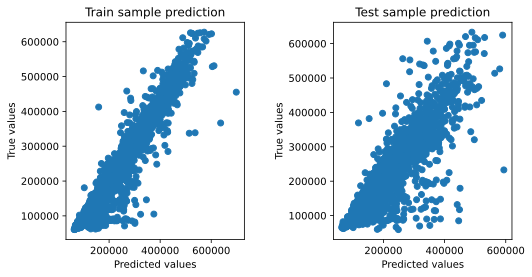

In [141]:
#evaluate_preds(y_train, y_train_preds2, y1_valid, y_valid_preds2)
evaluate_preds(y_train, y_train_preds*x_train['Square'], y_valid, y_valid_preds*x_valid['Square'])

In [142]:
# feature_importances = pd.DataFrame(zip(x_train[selected_features].columns, rf_model.feature_importances_), 
#                                    columns=['feature_name', 'importance'])

# feature_importances.sort_values(by='importance', ascending=False)

In [143]:
#selected_features = feature_importances.iloc[0:20]['feature_name']

In [144]:
#selected_features

In [145]:
# gb_model = GradientBoostingRegressor()
# parameters2 = {'n_estimators': [400, 300, 200, 100], 'max_depth': [10, 6, 4, 3]}   

In [146]:
# clf2 = GridSearchCV(
#     estimator=gb_model,
#     param_grid=parameters2,
#     scoring='r2',
#     cv=KFold(n_splits=5,   
#             random_state=21, 
#             shuffle=True),
#     n_jobs=-1)

# clf2.fit(x_train, y1_train.values)

# clf2.best_params_


In [147]:
# res2 = pd.DataFrame(clf2.cv_results_)
# res2.sort_values(by='rank_test_score', ascending=True, inplace=True)
# res2.head(10)

In [148]:
gb_model = GradientBoostingRegressor(n_estimators=100, max_depth=4, random_state=21)
gb_model.fit(x_train, y1_train.values)

GradientBoostingRegressor(max_depth=4, random_state=21)

In [149]:
y_train_preds2 = gb_model.predict(x_train)
y_valid_preds2 = gb_model.predict(x_valid)

Train R2:	0.809
Test R2:	0.743


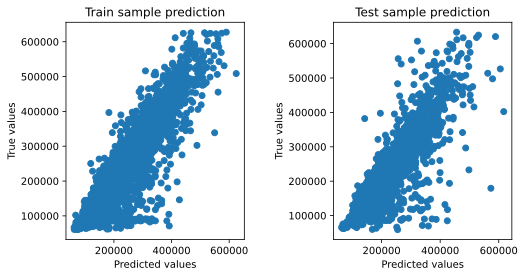

In [150]:
#evaluate_preds(y1_train, y_train_preds3, y1_valid, y_valid_preds3)
evaluate_preds(y_train, y_train_preds2*x_train['Square'], y_valid, y_valid_preds2*x_valid['Square'])
#evaluate_preds(y1_train*x_train['Square'], y_train_preds3*x_train['Square'], y1_valid*x_valid['Square'], y_valid_preds3*x_valid['Square'])

In [151]:
# feature_importances = pd.DataFrame(zip(x_train.columns, gb_model.feature_importances_), 
#                                    columns=['feature_name', 'importance'])

# feature_importances.sort_values(by='importance', ascending=False, inplace=True)

In [152]:
# feature_importances

In [153]:
# y_test_pred2 = gb_model2.predict(test_df)

In [154]:
# submit['Price'] = y_test_pred2

In [155]:
# submit.to_csv('C:/Users/li_le/geekbrains_study/Price_prediction/prediction_gb1.csv',  sep=',', index=False)

In [156]:
vr = VotingRegressor(estimators=[('gb', gb_model), ('rf', rf_model)], n_jobs=-1)

In [157]:
vr.fit(x_train, y1_train)

VotingRegressor(estimators=[('gb',
                             GradientBoostingRegressor(max_depth=4,
                                                       random_state=21)),
                            ('rf',
                             RandomForestRegressor(max_depth=20,
                                                   min_samples_leaf=2,
                                                   n_estimators=250,
                                                   random_state=21))],
                n_jobs=-1)

In [158]:
y_train_preds4 = vr.predict(x_train)
y_valid_preds4 = vr.predict(x_valid)

Train R2:	0.883
Test R2:	0.757


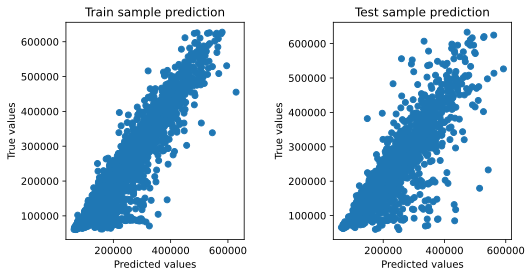

In [159]:
#evaluate_preds(y1_train, y_train_preds2, y1_valid, y_valid_preds2)
evaluate_preds(y_train, y_train_preds4*x_train['Square'], y_valid, y_valid_preds4*x_valid['Square'])

In [160]:
y_test_pred = vr.predict(test_df)

In [171]:
#submit = pd.read_csv('C:/Users/li_le/geekbrains_study/Price_prediction/sample_submission.csv', sep=',')

In [162]:
#submit['Price'] = y_test_pred*test_df['Square']

In [182]:
a =pd.DataFrame(y_test_pred*test_df['Square']).rename(columns={'Square':'Price'})
a

,Price
Id,
1,250864.998384
3,143280.116079
4,213139.429011
8,345327.203568
9,120143.911510
...,...
16787,327154.445318
16788,168083.293993
16789,236898.985938


In [177]:
#submit

,Id,Price
0,4567,200000.0
1,5925,200000.0
2,960,200000.0
3,3848,200000.0
4,746,200000.0
...,...,...
4995,10379,200000.0
4996,16138,200000.0
4997,3912,200000.0
4998,5722,200000.0


In [183]:
a.to_csv('C:/Users/li_le/geekbrains_study/Price_prediction/prediction_vr.csv',  sep=',')